In [78]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px

# Region 

In [2]:
Region = pd.read_csv("./data/Region.csv")
Region.head()

,code,province,city,latitude,longitude,elementary_school_count,kindergarten_count,university_count,academy_ratio,elderly_population_ratio,elderly_alone_ratio,nursing_home_count
0,10000,Seoul,Seoul,37.566953,126.977977,607,830,48,1.44,15.38,5.8,22739
1,10010,Seoul,Gangnam-gu,37.518421,127.047222,33,38,0,4.18,13.17,4.3,3088
2,10020,Seoul,Gangdong-gu,37.530492,127.123837,27,32,0,1.54,14.55,5.4,1023
3,10030,Seoul,Gangbuk-gu,37.639938,127.025508,14,21,0,0.67,19.49,8.5,628
4,10040,Seoul,Gangseo-gu,37.551166,126.849506,36,56,1,1.17,14.39,5.7,1080


In [3]:
Region.shape

(244, 12)

In [4]:
# code : 중복 없음.

In [5]:
Region.columns

Index(['code', 'province', 'city', 'latitude', 'longitude',
       'elementary_school_count', 'kindergarten_count', 'university_count',
       'academy_ratio', 'elderly_population_ratio', 'elderly_alone_ratio',
       'nursing_home_count'],
      dtype='object')

In [6]:
Region_total = Region[Region.province == Region.city]
Region_total

,code,province,city,latitude,longitude,elementary_school_count,kindergarten_count,university_count,academy_ratio,elderly_population_ratio,elderly_alone_ratio,nursing_home_count
0,10000,Seoul,Seoul,37.566953,126.977977,607,830,48,1.44,15.38,5.8,22739
26,11000,Busan,Busan,35.179884,129.074796,304,408,22,1.40,18.41,8.6,6752
43,12000,Daegu,Daegu,35.872150,128.601783,229,355,11,1.62,15.78,7.5,5083
52,13000,Gwangju,Gwangju,35.160467,126.851392,155,312,17,2.38,13.57,6.4,2852
58,14000,Incheon,Incheon,37.456188,126.705920,250,403,7,1.27,13.20,5.8,4497
69,15000,Daejeon,Daejeon,36.350621,127.384744,148,260,15,1.49,13.65,5.8,2984
75,16000,Ulsan,Ulsan,35.539797,129.311538,119,200,4,2.21,11.76,5.2,1801
81,17000,Sejong,Sejong,36.480132,127.289021,48,60,3,1.78,9.48,3.8,491
82,20000,Gyeonggi-do,Gyeonggi-do,37.275119,127.009466,1277,2237,61,1.60,12.63,5.2,20491
114,30000,Gangwon-do,Gangwon-do,37.885369,127.729868,349,368,18,1.42,19.89,9.8,2519


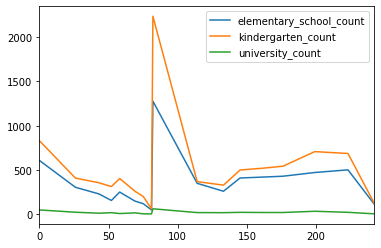

In [7]:
# 학교
Region_total.iloc[:-1,:][['elementary_school_count', 'kindergarten_count', 'university_count']].plot()

In [8]:
Region_small = Region.drop(list(Region_total.index))
Region_small

,code,province,city,latitude,longitude,elementary_school_count,kindergarten_count,university_count,academy_ratio,elderly_population_ratio,elderly_alone_ratio,nursing_home_count
1,10010,Seoul,Gangnam-gu,37.518421,127.047222,33,38,0,4.18,13.17,4.3,3088
2,10020,Seoul,Gangdong-gu,37.530492,127.123837,27,32,0,1.54,14.55,5.4,1023
3,10030,Seoul,Gangbuk-gu,37.639938,127.025508,14,21,0,0.67,19.49,8.5,628
4,10040,Seoul,Gangseo-gu,37.551166,126.849506,36,56,1,1.17,14.39,5.7,1080
5,10050,Seoul,Gwanak-gu,37.478290,126.951502,22,33,1,0.89,15.12,4.9,909
...,...,...,...,...,...,...,...,...,...,...,...,...
237,61140,Gyeongsangnam-do,Tongyeong-si,34.854426,128.433210,20,29,0,1.70,18.47,9.8,230
238,61150,Gyeongsangnam-do,Hadong-gun,35.067224,127.751271,16,15,0,0.84,32.89,19.1,94
239,61160,Gyeongsangnam-do,Haman-gun,35.272481,128.406540,16,20,0,1.19,23.74,14.7,94
240,61170,Gyeongsangnam-do,Hamyang-gun,35.520541,127.725177,13,12,0,1.01,32.65,20.9,83


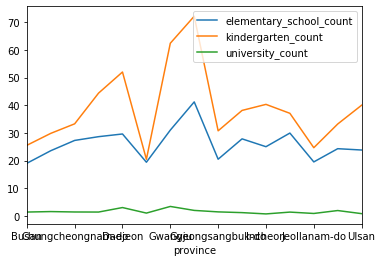

In [9]:
school = Region_small.groupby('province')['elementary_school_count', 'kindergarten_count', 'university_count'].mean()
school.plot()

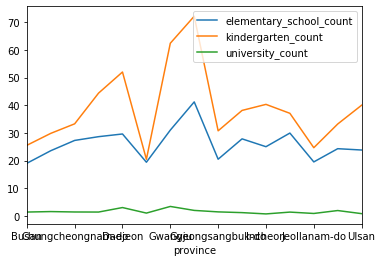

In [10]:
school.plot()

In [11]:
elder = Region.groupby(['province'])['elderly_population_ratio', 'elderly_alone_ratio'].mean()
elder

,elderly_population_ratio,elderly_alone_ratio
province,,
Busan,19.357647,9.094118
Chungcheongbuk-do,23.192500,11.825000
Chungcheongnam-do,23.844375,11.706250
Daegu,17.031111,7.966667
Daejeon,14.376667,6.200000
Gangwon-do,22.890526,11.578947
Gwangju,14.815000,6.716667
Gyeonggi-do,14.429688,6.084375
Gyeongsangbuk-do,27.556250,15.133333


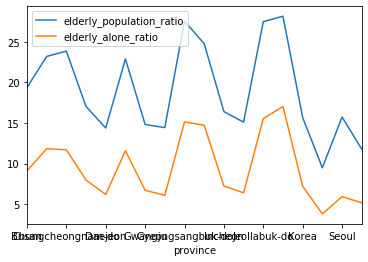

In [12]:
elder.plot()

'elderly_population_ratio'이 높을수록 'elderly_alone_ratio'도 높다

In [13]:
pd.pivot_table(Region,
               index=['province','city'])
#                        , 'kindergarten_count', 'university_count',
#                        'academy_ratio', 'elderly_population_ratio', 'elderly_alone_ratio','nursing_home_count'])

academy_ratio   code  elderly_alone_ratio  \
province city                                                     
Busan    Buk-gu                1.35  11080                  8.4   
         Busan                 1.40  11000                  8.6   
         Busanjin-gu           1.62  11070                  8.7   
         Dong-gu               0.83  11050                 13.8   
         Dongnae-gu            1.98  11060                  7.7   
...                             ...    ...                  ...   
Ulsan    Dong-gu               1.73  16020                  4.4   
         Jung-gu               2.03  16050                  6.5   
         Nam-gu                3.23  16010                  4.8   
         Ulju-gun              1.74  16040                  6.7   
         Ulsan                 2.21  16000                  5.2   

                      elderly_population_ratio  elementary_school_count  \
province city                                                             
Busan    Buk-gu                          16.04                       27   
         Busan                           18.41                      304   
         Busanjin-gu                     19.01                       32   
         Dong-gu                         25.42                        7   
         Dongnae-gu                      17.53                       22   
...                                        ...                      ...   
Ulsan    Dong-gu                         11.68                       16   
         Jung-gu                         14.15                       21   
         Nam-gu                          11.42                       30   
         Ulju-gun                        13.94                       30   
         Ulsan                           11.76                      119   

                      kindergarten_count   latitude   longitude  \
province city                                                     
Busan    Buk-gu                       37  35.197483  128.990224   
         Busan                       408  35.179884  129.074796   
         Busanjin-gu                  43  35.163332  129.053058   
         Dong-gu                       9  35.129432  129.045540   
         Dongnae-gu                   31  35.205060  129.083673   
...                                  ...        ...         ...   
Ulsan    Dong-gu                      25  35.504806  129.416575   
         Jung-gu                      37  35.569468  129.332773   
         Nam-gu                       44  35.543833  129.330047   
         Ulju-gun                     49  35.522126  129.242507   
         Ulsan                       200  35.539797  129.311538   

                      nursing_home_count  university_count  
province city                                               
Busan    Buk-gu                      465                 1  
         Busan                      6752                22  
         Busanjin-gu                 986                 3  
         Dong-gu                     239                 0  
         Dongnae-gu                  608                 0  
...                                  ...               ...  
Ulsan    Dong-gu                     242                 1  
         Jung-gu                     323                 0  
         Nam-gu                      765                 1  
         Ulju-gun                    260                 2  
         Ulsan                      1801                 4  

[244 rows x 10 columns]

In [14]:
for column in Region.columns:
    print(Region[column].value_counts())

60110    1
13000    1
51060    1
20160    1
61040    1
        ..
10060    1
11080    1
60230    1
51190    1
10240    1
Name: code, Length: 244, dtype: int64
Gyeonggi-do          32
Seoul                26
Gyeongsangbuk-do     24
Jeollanam-do         23
Gangwon-do           19
Gyeongsangnam-do     19
Busan                17
Chungcheongnam-do    16
Jeollabuk-do         15
Chungcheongbuk-do    12
Incheon              11
Daegu                 9
Gwangju               6
Daejeon               6
Ulsan                 6
Sejong                1
Jeju-do               1
Korea                 1
Name: province, dtype: int64
Dong-gu          6
Jung-gu          6
Seo-gu           5
Buk-gu           4
Nam-gu           4
                ..
Yeongcheon-si    1
Chungju-si       1
Gimhae-si        1
Hongcheon-gun    1
Jinju-si         1
Name: city, Length: 222, dtype: int64
37.566953    2
36.805702    1
37.240985    1
37.483804    1
37.503393    1
            ..
35.919325    1
37.495632    1
37.484438    

# SearchTrend

In [17]:
searchTrend = pd.read_csv("./data/SearchTrend.csv")
searchTrend.head()

,date,cold,flu,pneumonia,coronavirus
0,2016-01-01,0.11663,0.05590,0.15726,0.00736
1,2016-01-02,0.13372,0.17135,0.20826,0.00890
2,2016-01-03,0.14917,0.22317,0.19326,0.00845
3,2016-01-04,0.17463,0.18626,0.29008,0.01145
4,2016-01-05,0.17226,0.15072,0.24562,0.01381


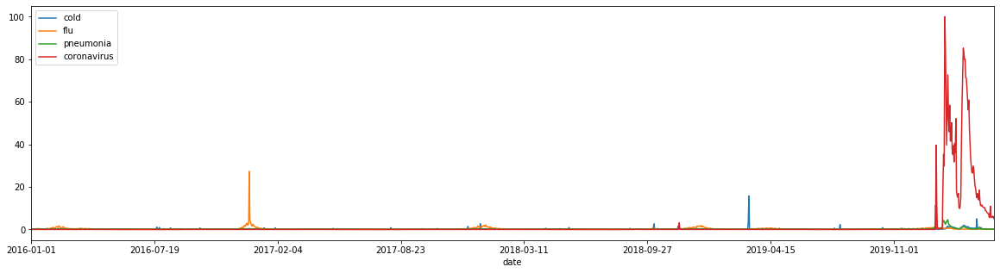

In [26]:
searchTrend.set_index('date',drop=True).plot(figsize=(20,5))

In [29]:
import plotly.graph_objects as go

fig = go.Figure() # Figure 객체 생성
fig.add_trace(go.Scatter(x=searchTrend['date'],y= searchTrend['cold'],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='cold'))
fig.add_trace(go.Scatter(x=searchTrend['date'],y= searchTrend['flu'],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='flu'))
fig.add_trace(go.Scatter(x=searchTrend['date'],y= searchTrend['pneumonia'],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='pneumonia'))
fig.add_trace(go.Scatter(x=searchTrend['date'],y= searchTrend['coronavirus'],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='coronavirus'))

# layout 전체 그래프 틀 만들어주는 것
# <b> 볼드체 글쓰기
# color : 복사해서 구글에 치면 색깔 조절해서 해당 HEX가져올 수 있음
# family : 글씨체 > 지원되는 글씨체가 많이는 없는듯
fig.update_layout(title='<b>시간에 따른 검색어 트랜드</b>',
                   xaxis_title='Month',
                   yaxis_title='Percentage',
                 font=dict(size=18,color='#60606e',family='Franklin Gothic' ))
# iplot(fig)
fig.show()


2016년 12월 독감유행

2019년 3월 감기가 유행이였던것 같음

2020년 1월8일 폐렴 검색 증가 -> 코로나 검색 증가
 - 1/20 첫 확진자 발생 -> 코로나 검색 증가
 - 2/18 31번 확진자 확진판정 후 급증
 

# Seoul Floating
유동인구

In [30]:
seoulFloating = pd.read_csv("./data/SeoulFloating.csv")
seoulFloating.head()

,date,hour,birth_year,sex,province,city,fp_num
0,2020-01-01,0,20,female,Seoul,Dobong-gu,19140
1,2020-01-01,0,20,male,Seoul,Dobong-gu,19950
2,2020-01-01,0,20,female,Seoul,Dongdaemun-gu,25450
3,2020-01-01,0,20,male,Seoul,Dongdaemun-gu,27050
4,2020-01-01,0,20,female,Seoul,Dongjag-gu,28880


In [31]:
seoulFloating.isnull().sum()

date          0
hour          0
birth_year    0
sex           0
province      0
city          0
fp_num        0
dtype: int64

In [47]:
seoulFloating.province.value_counts() # 서울
seoulFloating.hour.value_counts() # 시간 0-23
seoulFloating.birth_year.value_counts() # 20,30,40,50,60,70 탄생년도...중년 노년 층만 조사한 건가...
len(seoulFloating.city.value_counts()) # 25곳

25

In [55]:
city_names = list(set(seoulFloating.city))

In [58]:
city1 = seoulFloating[seoulFloating.city==city_names[0]]
city2 = seoulFloating[seoulFloating.city==city_names[1]]
city3 = seoulFloating[seoulFloating.city==city_names[2]]
city4 = seoulFloating[seoulFloating.city==city_names[3]]
city5 = seoulFloating[seoulFloating.city==city_names[4]]
city6 = seoulFloating[seoulFloating.city==city_names[5]]
city7 = seoulFloating[seoulFloating.city==city_names[6]]
city8 = seoulFloating[seoulFloating.city==city_names[7]]
city9 = seoulFloating[seoulFloating.city==city_names[8]]
city10 = seoulFloating[seoulFloating.city==city_names[9]]
city11 = seoulFloating[seoulFloating.city==city_names[10]]
city12 = seoulFloating[seoulFloating.city==city_names[11]]
city13 = seoulFloating[seoulFloating.city==city_names[12]]
city14 = seoulFloating[seoulFloating.city==city_names[13]]
city15 = seoulFloating[seoulFloating.city==city_names[14]]
city16 = seoulFloating[seoulFloating.city==city_names[15]]
city17 = seoulFloating[seoulFloating.city==city_names[16]]
city18 = seoulFloating[seoulFloating.city==city_names[17]]
city19 = seoulFloating[seoulFloating.city==city_names[18]]
city20 = seoulFloating[seoulFloating.city==city_names[19]]
city21 = seoulFloating[seoulFloating.city==city_names[20]]
city22 = seoulFloating[seoulFloating.city==city_names[21]]
city23 = seoulFloating[seoulFloating.city==city_names[22]]
city24 = seoulFloating[seoulFloating.city==city_names[23]]
city25 = seoulFloating[seoulFloating.city==city_names[24]]

In [95]:
pd.pivot_table(city1,index='date',columns='birth_year',values='fp_num')

birth_year,20,30,40,50,60,70
date,,,,,,
2020-01-01,44117.916667,48344.166667,48107.500000,41466.458333,27766.041667,19392.500000
2020-01-02,64343.958333,81721.666667,72492.083333,54026.458333,33700.416667,21866.458333
2020-01-03,66276.875000,83532.083333,73001.875000,54930.833333,34290.208333,22017.291667
2020-01-04,54101.041667,60565.833333,56421.458333,47492.708333,30748.333333,20346.041667
2020-01-05,48449.791667,53654.583333,51689.583333,43974.166667,28815.000000,19726.041667
2020-01-06,65065.208333,83069.583333,73547.500000,54617.291667,34184.791667,22104.583333
2020-01-07,65279.375000,84015.625000,73336.875000,54559.375000,34272.083333,22167.083333
2020-01-08,65706.250000,84068.333333,73486.875000,54518.958333,34152.708333,22148.333333
2020-01-09,66017.916667,84360.208333,73706.875000,54759.791667,34433.541667,22101.250000


In [88]:
# 구역별 성별
for name in city_names:
    city = seoulFloating[seoulFloating.city==name]
    
    city = pd.pivot_table(city,index='date',columns='sex',values='fp_num')
    
    fig = go.Figure() # Figure 객체 생성
    fig.add_trace(go.Scatter(x=city.index,y= city['female'],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='female'))
    fig.add_trace(go.Scatter(x=city.index,y= city['male'],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='male'))
    
    fig.update_layout(title= name,
                   xaxis_title='Date',
                   yaxis_title='Number',
                 font=dict(size=18,color='#60606e',family='Franklin Gothic' ))
    fig.show()

여자, 남자 개형 비슷

1/24-1/25 감소 : 24일에 2번째 확진자 나옴

2/23 증가 : 구정 시작

In [99]:
# 구역별 나이에 따라
for name in city_names:
    city = seoulFloating[seoulFloating.city==name]
    
    city = pd.pivot_table(city,index='date',columns='birth_year',values='fp_num')
    
    fig = go.Figure() # Figure 객체 생성
    fig.add_trace(go.Scatter(x=city.index,y= city[70],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='70'))
    fig.add_trace(go.Scatter(x=city.index,y= city[60],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='60'))
    fig.add_trace(go.Scatter(x=city.index,y= city[50],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='50'))
    fig.add_trace(go.Scatter(x=city.index,y= city[40],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='40'))
    fig.add_trace(go.Scatter(x=city.index,y= city[30],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='30'))
    fig.add_trace(go.Scatter(x=city.index,y= city[20],  # 그래프 하나씩 그리는 것
             mode='lines+markers', name='20'))
    
    fig.update_layout(title= name,
                   xaxis_title='Date',
                   yaxis_title='Number',
                 font=dict(size=18,color='#60606e',family='Franklin Gothic' ))
    fig.show()

In [ ]:
30 40 20 50 60 70
50 40 30 20 60 70
30 40 50 20 60 70
20 30 4050 60 70
30 20 40 50 60 70
4030 50 20 60 70
40 50 30 20 60 70
30 40 50 20 60 70
30 40 50 20 60 70
50 40 30 20 60 70
40 50 30 20 60 70
30 40 20 50 60 70
30 40 50 20 60 70
40 20 50 30 60 70
50 40 30 20 60 70
40 50 20 30 60 70
30 40 5020 60 70
3040 20 50 60 70
20 50 40 30 60 70
30 40 50 20 60 70
30 20 4050 60 70
50 40 30 20 60 70
504030 20 60 70
20 30 40 50 60 70
20 40 3050 6070

20대가 감소와 증가 폭이 큼

In [104]:
# 구역별 시간에 따라
for name in city_names:
    city = seoulFloating[seoulFloating.city==name]
    
    city = pd.pivot_table(city,index='date',columns='hour',values='fp_num')
    
    fig = go.Figure() # Figure 객체 생성
    for i in range(24):
        fig.add_trace(go.Scatter(x=city.index,y= city[i],  # 그래프 하나씩 그리는 것
                 mode='lines+markers', name=str(i)+'시'))
    
    fig.update_layout(title= name,
                   xaxis_title='Date',
                   yaxis_title='Number',
                 font=dict(size=15,color='#60606e',family='Franklin Gothic' ))
    fig.show()

In [107]:
seoulFloating.groupby(['city','hour'])['fp_num'].mean()

city        hour
Dobong-gu   0       22443.694444
            1       22554.388889
            2       22615.527778
            3       22634.375000
            4       22545.111111
                        ...     
Yongsan-gu  19      18611.486111
            20      18076.805556
            21      17568.666667
            22      17034.333333
            23      16561.166667
Name: fp_num, Length: 600, dtype: float64

In [128]:
test = pd.DataFrame()
for day in list(set(city1.date)):
    test[day] = pd.pivot_table(city1, index='hour',columns='date',values='fp_num').sort_values(by=[day],ascending=False).index
test.reindex(sorted(test.columns), axis=1)

,2020-01-01,2020-01-02,2020-01-03,2020-01-04,2020-01-05,2020-01-06,2020-01-07,2020-01-08,2020-01-09,2020-01-10,...,2020-02-20,2020-02-21,2020-02-22,2020-02-23,2020-02-24,2020-02-25,2020-02-26,2020-02-27,2020-02-28,2020-02-29
0,17,13,14,14,14,14,14,14,14,14,...,14,14,13,13,14,14,14,14,13,14
1,18,14,13,13,13,13,13,13,13,13,...,13,13,14,14,13,13,13,13,14,13
2,16,15,15,15,15,15,15,15,15,15,...,15,12,12,15,12,12,12,15,12,12
3,15,12,12,12,12,12,12,12,12,12,...,12,15,15,12,15,15,15,12,11,11
4,19,11,11,16,16,11,11,11,11,11,...,11,11,11,16,11,11,11,11,15,15
5,0,16,16,11,17,16,16,16,16,16,...,16,16,16,17,10,10,10,10,16,10
6,20,10,10,17,11,10,10,10,10,10,...,10,10,17,18,16,16,16,16,17,16
7,14,17,17,10,18,17,17,17,17,17,...,17,17,10,10,9,17,9,9,10,17
8,12,9,9,18,10,9,9,9,9,9,...,9,9,18,19,17,9,17,17,9,9
9,13,18,18,19,19,18,18,18,18,18,...,18,18,9,9,8,18,8,8,8,18


In [133]:
test.T

,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
2020-01-13,14,13,15,12,11,16,10,17,9,18,...,21,22,6,23,5,0,1,2,4,3
2020-01-22,14,13,15,12,11,16,10,17,9,18,...,7,22,23,6,0,1,5,2,3,4
2020-02-28,13,14,12,11,15,16,17,10,9,8,...,21,22,6,23,0,1,5,2,3,4
2020-02-20,14,13,15,12,11,16,10,17,9,18,...,7,22,23,6,0,1,5,2,3,4
2020-01-23,12,11,13,10,14,9,15,16,8,17,...,21,6,22,0,1,2,5,23,3,4
2020-01-28,14,13,15,12,11,16,10,17,9,18,...,21,22,23,6,5,0,1,2,4,3
2020-02-09,13,14,12,15,16,11,17,18,10,19,...,22,0,23,7,1,2,6,3,5,4
2020-02-24,14,13,12,15,11,10,16,9,17,8,...,21,22,6,23,5,0,1,2,4,3
2020-02-29,14,13,12,11,15,10,16,17,9,18,...,7,0,22,1,6,2,23,3,5,4
2020-01-02,13,14,15,12,11,16,10,17,9,18,...,21,22,23,6,5,0,1,4,2,3


TypeError: data type 'cat_dtype' not understood

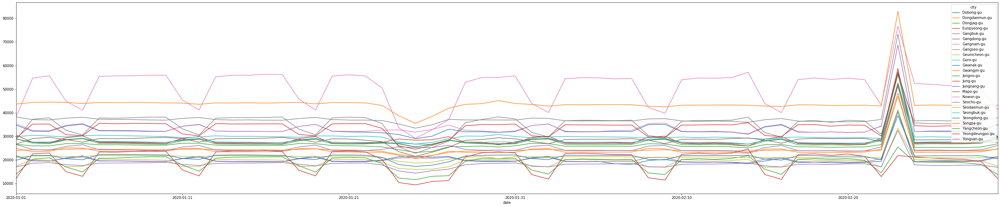

In [72]:
x = pd.DataFrame(seoulFloating.groupby(['date','city'])['fp_num'].mean())
pd.pivot_table(x, index='date',columns='city',values='fp_num').plot(figsize=(50,10))